In [1]:
import sys
import os

import so_ml_tools as soml

import tensorflow as tf
import numpy as np
import keras as ks
import opendatasets as od

from keras import Sequential, Model
from keras.optimizers import Adam
from keras.losses import categorical_crossentropy
from keras.utils import image_dataset_from_directory

2023-10-02 08:55:07.798198: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
!nvidia-smi

/bin/bash: /home/sodeso/anaconda3/envs/ml/lib/libtinfo.so.6: no version information available (required by /bin/bash)
Mon Oct  2 08:55:08 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.113.01             Driver Version: 535.113.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4090        Off | 00000000:01:00.0  On |                  Off |
|  0%   29C    P8              13W / 450W |    661MiB / 24564MiB |      0%      Default |
|                                       

In [3]:
tf.random.set_seed(42)

# Configure mixed-precision so we can improve the performance

In [4]:
# BASE_MODEL_NAME is used as a folder name for saved models.
IMG_SHAPE = (224, 224)

# Download the dataset from Kaggle (kaggle.json API key neccesary)

In [5]:
# Download the dogs and cats dataset
od.download_kaggle_dataset(dataset_url="https://www.kaggle.com/datasets/chetankv/dogs-cats-images/download?datasetVersionNumber=1",
                           data_dir="./data")

Skipping, found downloaded files in "./data/dogs-cats-images" (use force=True to force download)


# Inspect the contents of the downloaded dataset

In [6]:
TRAIN_DIR = "./data/dogs-cats-images/dataset/training_set"
TEST_DIR = "./data/dogs-cats-images/dataset/test_set"

In [7]:
soml.util.io.list_dir_summary(TRAIN_DIR)

There are 2 directories, and 0 in ./data/dogs-cats-images/dataset/training_set
There are 0 directories, and 4000 in ./data/dogs-cats-images/dataset/training_set/dogs
There are 0 directories, and 4000 in ./data/dogs-cats-images/dataset/training_set/cats


In [8]:
soml.util.io.list_dir_summary(TEST_DIR)

There are 2 directories, and 0 in ./data/dogs-cats-images/dataset/test_set
There are 0 directories, and 1000 in ./data/dogs-cats-images/dataset/test_set/dogs
There are 0 directories, and 1000 in ./data/dogs-cats-images/dataset/test_set/cats


# Show some random images from disk of the downloaded dataset

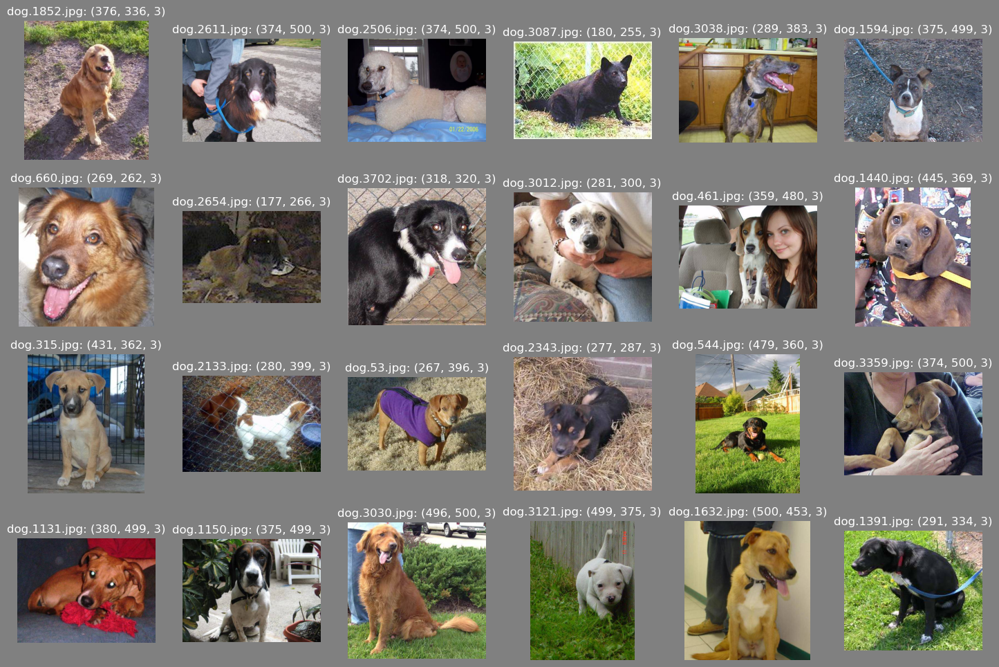

In [9]:
soml.data.image.show_random_image_from_disk(target_dir=TRAIN_DIR, target_class="dogs")

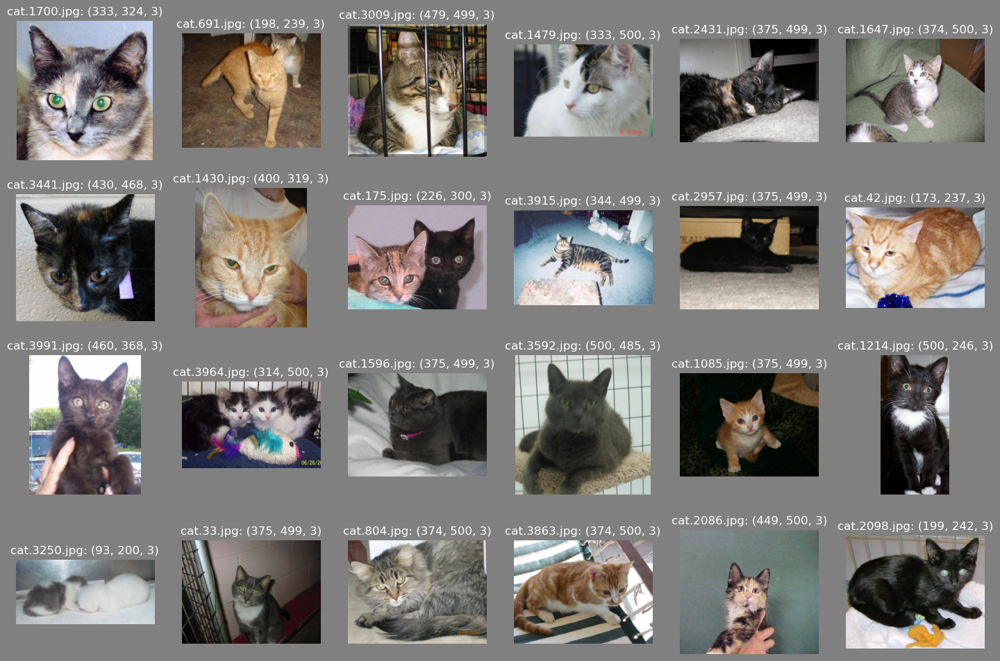

In [10]:
soml.data.image.show_random_image_from_disk(target_dir=TRAIN_DIR, target_class="cats")

# Create datasets for the train and test images

In [11]:
train_dataset = soml.data.loader.load_image_dataset_from_directory(directory=TRAIN_DIR,
                                                                   label_mode="categorical",
                                                                   batch_size=32,
                                                                   image_size=IMG_SHAPE,
                                                                   shuffle=True,
                                                                   seed=42)

test_dataset = soml.data.loader.load_image_dataset_from_directory(directory=TEST_DIR,
                                                                  label_mode="categorical",
                                                                  batch_size=32,
                                                                  image_size=IMG_SHAPE,
                                                                  shuffle=False,
                                                                  seed=42)

train_dataset = soml.tf.dataset.add_prefetching(dataset=soml.tf.dataset.add_shuffling(dataset=soml.tf.dataset.add_caching(dataset=soml.tf.dataset.add_rescaling_mapping(dataset=train_dataset))))
test_dataset = soml.tf.dataset.add_prefetching(dataset=soml.tf.dataset.add_shuffling(dataset=soml.tf.dataset.add_caching(dataset=soml.tf.dataset.add_rescaling_mapping(dataset=test_dataset))))

len(train_dataset), len(test_dataset)

Found 8000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.
WARN: Dataset is already shuffled.
Buffer size for shuffle has been set to 1000
WARN: Dataset is already prefetched.
Buffer size for shuffle has been set to 1000
WARN: Dataset is already prefetched.


(250, 63)

# Get class-names from the dataset

In [12]:
class_names = soml.tf.dataset.get_class_names(dataset=train_dataset)
class_names

['cats', 'dogs']

# Inspect some random images from the dataset to check image size, and quality

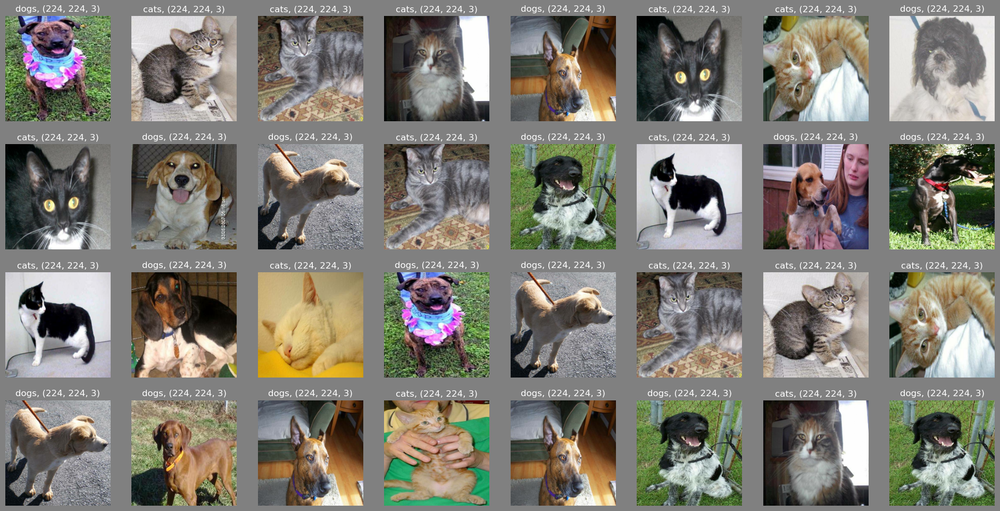

In [13]:
soml.tf.dataset.show_images_from_dataset(dataset=train_dataset, shape=(4, 8))

# Create Data Augmentation Layer

In [64]:
data_augmentation = ks.Sequential([
    ks.layers.RandomFlip(mode='horizontal')
])

# Create the model

In [65]:
input_layer = ks.layers.Input(shape=IMG_SHAPE + (3,))

# convolutional_layers = [(64, 2), (128, 2), (256, 3), (512, 3), (512, 3)] # 86%d, 86%c, 86% accuracy      91.04% accuracy with augmentation
# convolutional_layers = [(64, 2), (128, 2), (256, 3), (512, 2), (512, 2)] # 84%d, 84%c, 83.95% accuracy   80,09% accuracy with augmentation
# convolutional_layers = [(64, 2), (128, 2), (256, 2), (512, 2), (512, 2)] # 88%d, 89%c, 88.15% accuracy,  90.24% accuracy with augmentation
# convolutional_layers = [(64, 2), (128, 2), (256, 3), (512, 3)]           # 86%d, 85%c, 85.35% accuracy   87.55% accuracy with augmentation
# convolutional_layers = [(64, 2), (128, 2), (256, 3), (512, 2)]           # 85%c, 84%d, 84.79% accuracy   88.30% accuracy with augmentation
convolutional_layers = [(64, 2), (128, 2), (256, 2), (512, 2)]             # 77%c, 70%d, 74,19% accuracy   90.35% accuracy with augmentation

x = data_augmentation(input_layer)
for filters, n_convs in convolutional_layers:
    for _ in np.arange(n_convs):
        x = ks.layers.Conv2D(filters=filters, kernel_size=3, activation="relu", padding='same')(x)
    x = ks.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)
    
x = ks.layers.GlobalAveragePooling2D()(x)
x = ks.layers.Dense(units=64, activation="relu")(x)
x = ks.layers.BatchNormalization()(x)
output_layer = ks.layers.Dense(units=len(class_names), activation="softmax")(x)

model = Model(input_layer, output_layer)

model.compile(loss=ks.losses.CategoricalCrossentropy(),
              optimizer=ks.optimizers.Adam(),
              metrics=["accuracy"])

In [66]:
soml.tf.model.inspect.list_model(model=model)

row   | name (type)                                          | dtype   | policy  | trainable | output shape          | Total Param # | Trainable Param # | Non-trainable Param #
0     | input_12                    (InputLayer            ) | float32 | float32 | True      | [(None, 224, 224, 3)] | 0             | 0                 | 0                    
1     | random_flip_2               (RandomFlip            ) | float32 | float32 | True      | (None, 224, 224, 3)   | 0             | 0                 | 0                    
2     | conv2d_88                   (Conv2D                ) | float32 | float32 | True      | (None, 224, 224, 64)  | 1,792         | 1,792             | 0                    
3     | conv2d_89                   (Conv2D                ) | float32 | float32 | True      | (None, 224, 224, 64)  | 36,928        | 36,928            | 0                    
4     | max_pooling2d_44            (MaxPooling2D          ) | float32 | float32 | True      | (None, 112, 112, 64)

# Create the neccesary callbacks to evaluate

In [67]:
early_stopping_callback = soml.tf.fit.callback.early_stopping_callback()
reduce_lr_on_plateau_callback = soml.tf.fit.callback.reduce_lr_on_plateau_callback()

# Fit the mode

In [68]:
model_history = model.fit(
    epochs=100,
    x=train_dataset,
    steps_per_epoch=len(train_dataset),
    validation_data=test_dataset,
    validation_steps=len(test_dataset),
    callbacks=[early_stopping_callback, reduce_lr_on_plateau_callback],
)

Epoch 1/100
250/250 [==============================] - 15s 53ms/step - loss: 0.6563 - accuracy: 0.6093 - val_loss: 0.7628 - val_accuracy: 0.5535 - lr: 0.0010
Epoch 2/100
250/250 [==============================] - 13s 53ms/step - loss: 0.6224 - accuracy: 0.6603 - val_loss: 0.8718 - val_accuracy: 0.5030 - lr: 0.0010
Epoch 3/100
250/250 [==============================] - 13s 53ms/step - loss: 0.6085 - accuracy: 0.6718 - val_loss: 0.6218 - val_accuracy: 0.6590 - lr: 0.0010
Epoch 4/100
250/250 [==============================] - 13s 52ms/step - loss: 0.5949 - accuracy: 0.6852 - val_loss: 1.1335 - val_accuracy: 0.5090 - lr: 0.0010
Epoch 5/100
250/250 [==============================] - 13s 53ms/step - loss: 0.5638 - accuracy: 0.7160 - val_loss: 0.8170 - val_accuracy: 0.5735 - lr: 0.0010
Epoch 6/100
250/250 [==============================] - 13s 53ms/step - loss: 0.5449 - accuracy: 0.7341 - val_loss: 0.5394 - val_accuracy: 0.7350 - lr: 0.0010
Epoch 7/100
250/250 [==============================]

# Inspect the history of fitting the model

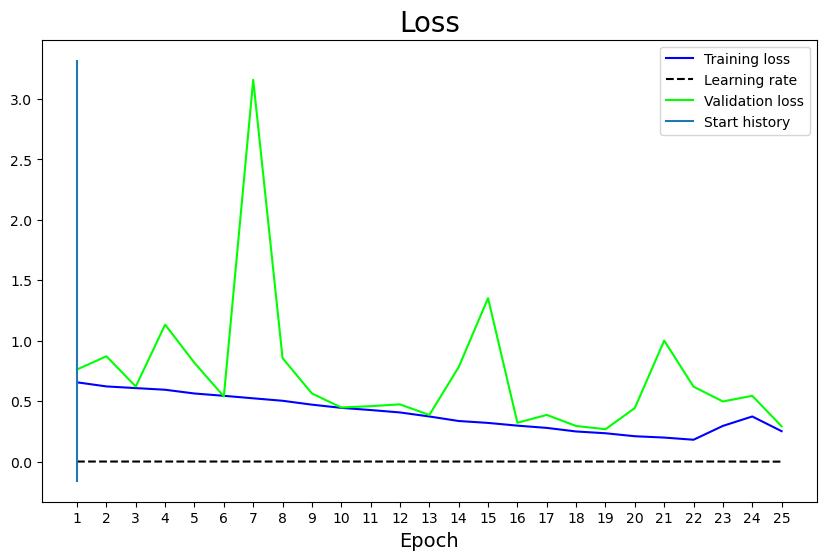

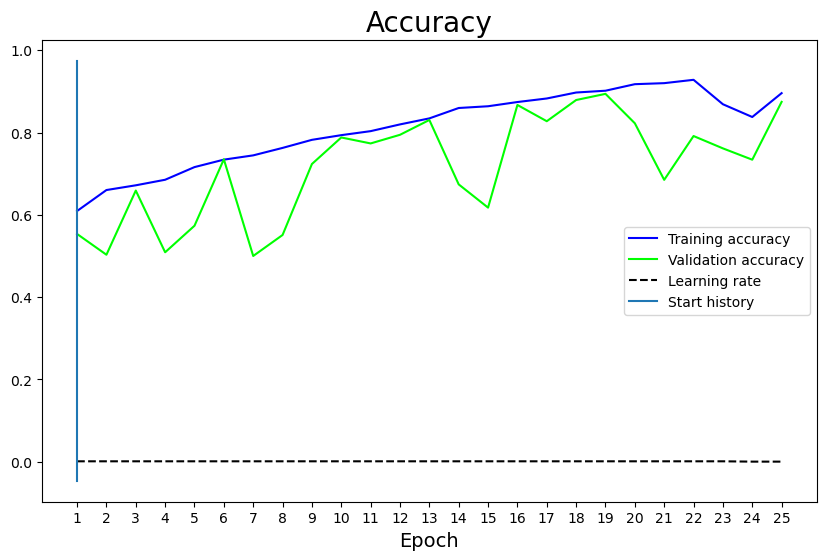

In [70]:
soml.tf.model.plot.plot_history(history=model_history)

# Evaluate the model

In [69]:
model_evaluation = model.evaluate(x=test_dataset)
model_evaluation

63/63 [==============================] - 1s 19ms/step - loss: 0.2684 - accuracy: 0.8940


[0.26837441325187683, 0.8939999938011169]

# Create confusion matrix on all the predictions of the test images

In [71]:
y_true, y_prob = soml.tf.model.predict.classification_dataset_with_labels(model=model, dataset=test_dataset)

1/1 [==============================] - 0s 9ms/step


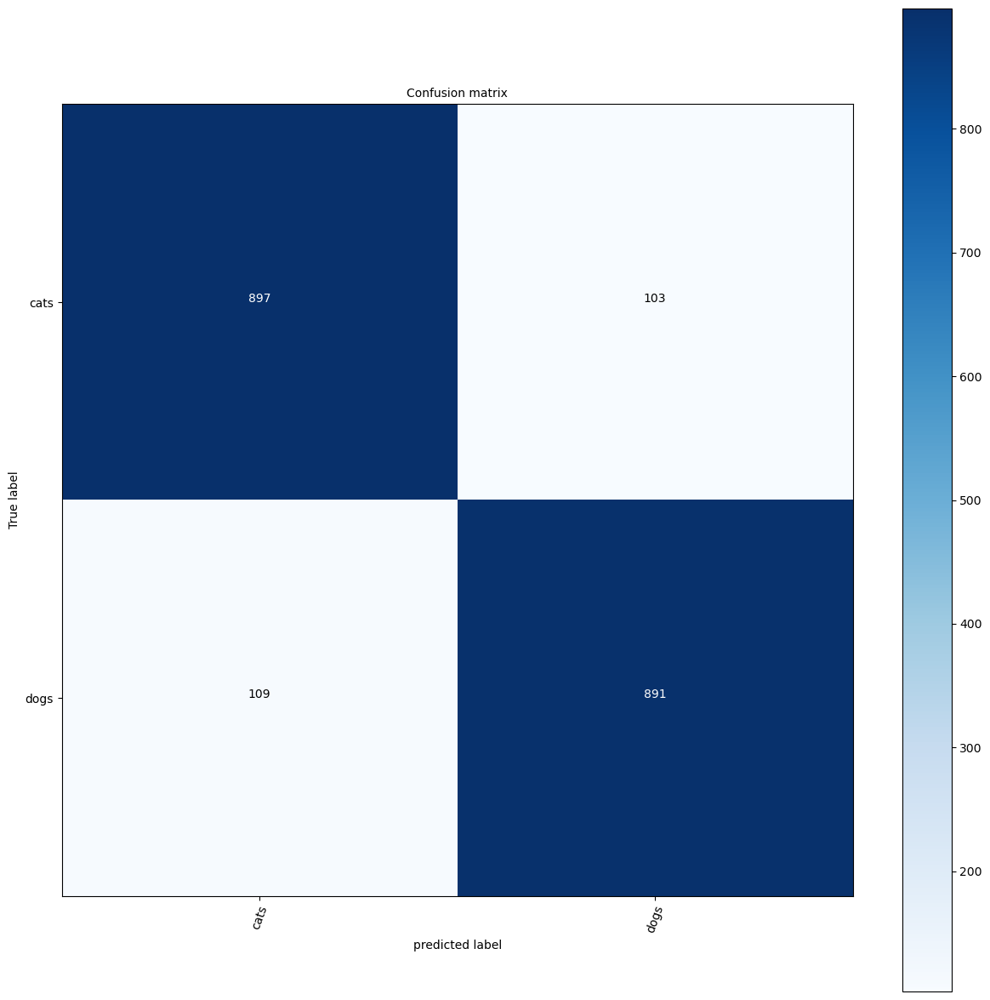

In [72]:
soml.evaluate.plot.confusion_matrix(y_true=y_true, y_prob=y_prob, class_names=class_names)

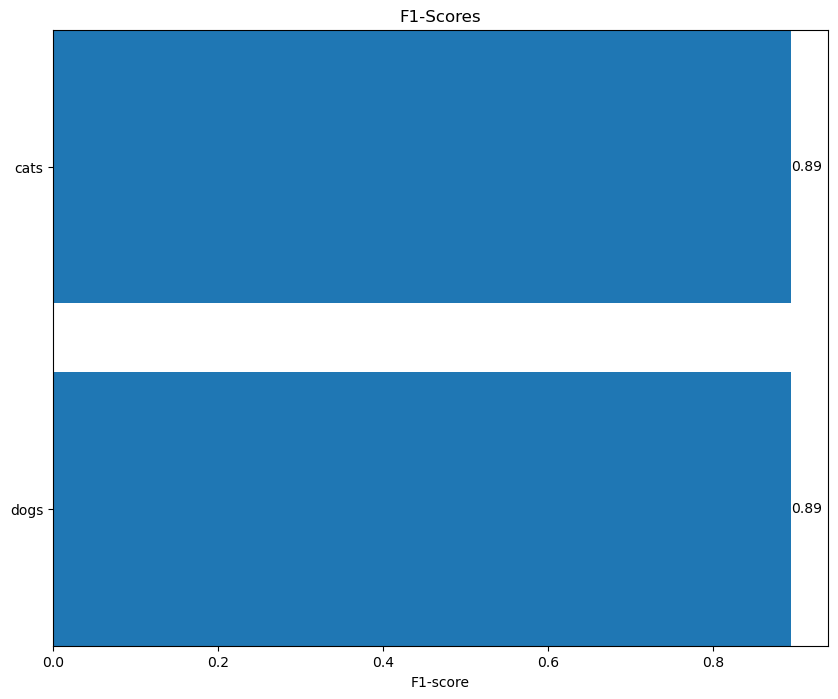

In [73]:
soml.evaluate.plot.report_f1_score(y_true=y_true, y_prob=y_prob, class_names=class_names)

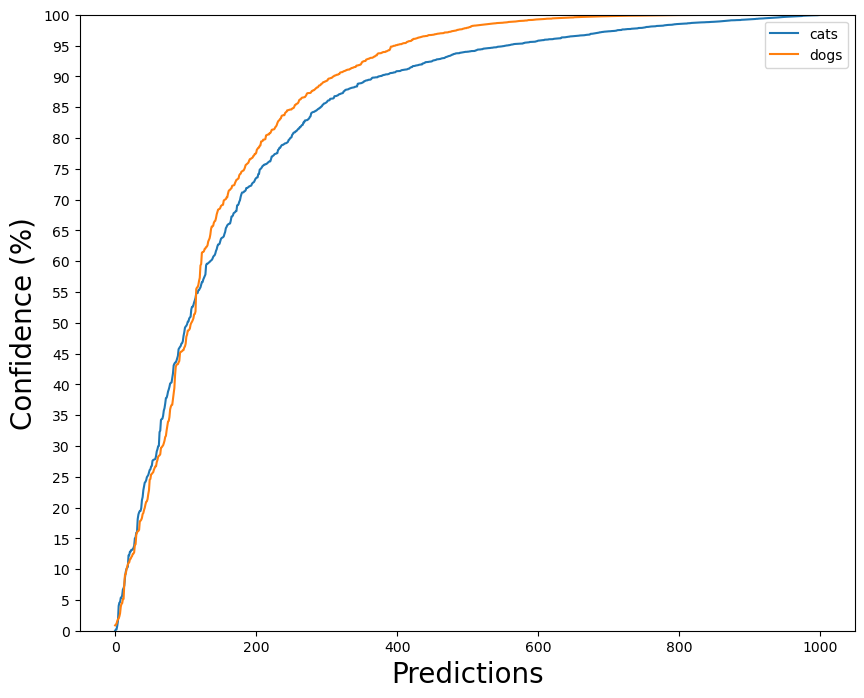

In [74]:
soml.evaluate.plot.prediction_confidence(y_true=y_true, y_prob=y_prob, class_names=class_names)

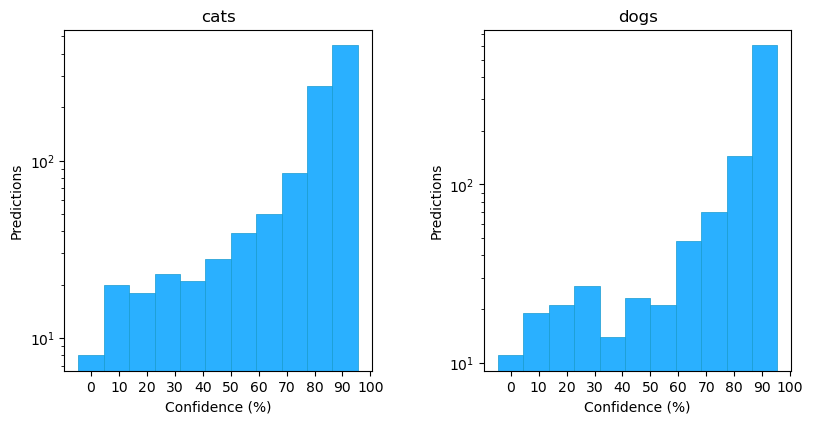

In [75]:
soml.evaluate.plot.prediction_confidence_histogram(y_true=y_true, y_prob=y_prob, class_names=class_names)

# Make some predictions of our own

In [76]:
SAMPLES_DIR = "./samples"

soml.util.io.list_dir_summary(SAMPLES_DIR)

There are 0 directories, and 6 in ./samples


1/1 [==============================] - 0s 41ms/step


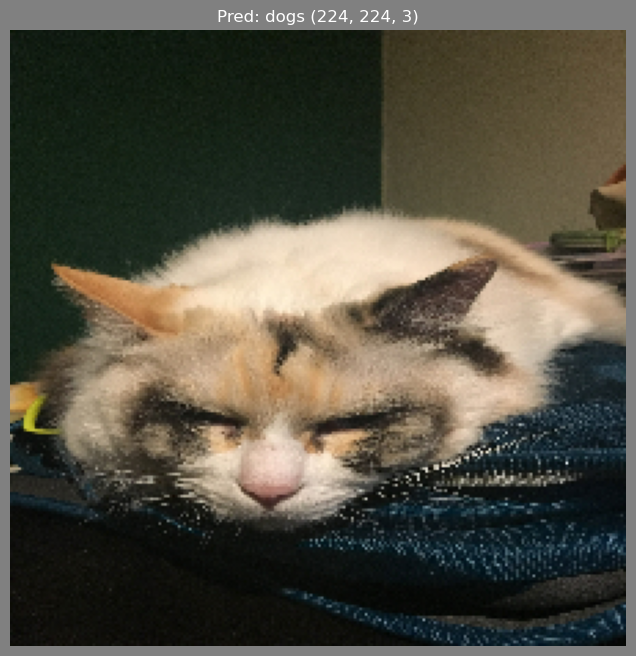

In [77]:
img = soml.data.image.load_image_as_tensor(filename=os.path.join(SAMPLES_DIR, "cat_1.jpeg"), img_shape=IMG_SHAPE, scale=True)
y_pred = soml.util.label.probability_to_class(model.predict(x=soml.tf.tensor.add_batch_to_tensor(img)))
soml.data.image.show_single_image_from_nparray_or_tensor(image=img, title=f"Pred: {class_names[y_pred[0]]}")

1/1 [==============================] - 0s 9ms/step


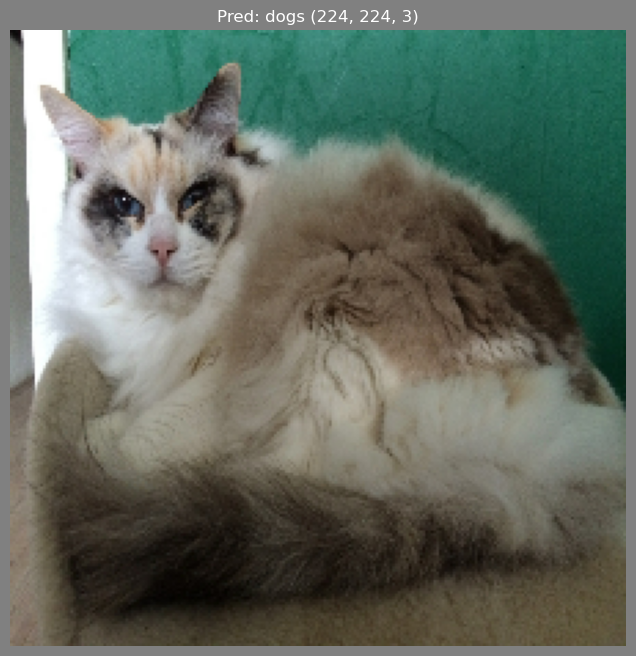

In [78]:
img = soml.data.image.load_image_as_tensor(filename=os.path.join(SAMPLES_DIR, "cat_2.jpeg"), img_shape=IMG_SHAPE, scale=True)
y_pred = soml.util.label.probability_to_class(model.predict(x=soml.tf.tensor.add_batch_to_tensor(img)))
soml.data.image.show_single_image_from_nparray_or_tensor(image=img, title=f"Pred: {class_names[y_pred[0]]}")

1/1 [==============================] - 0s 9ms/step


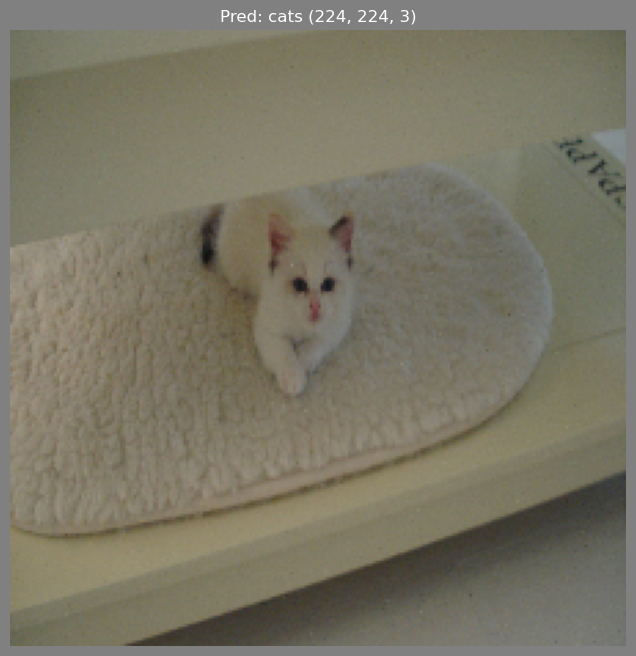

In [79]:
img = soml.data.image.load_image_as_tensor(filename=os.path.join(SAMPLES_DIR, "cat_3.jpg"), img_shape=IMG_SHAPE, scale=True)
y_pred = soml.util.label.probability_to_class(model.predict(x=soml.tf.tensor.add_batch_to_tensor(img)))
soml.data.image.show_single_image_from_nparray_or_tensor(image=img, title=f"Pred: {class_names[y_pred[0]]}")

1/1 [==============================] - 0s 14ms/step


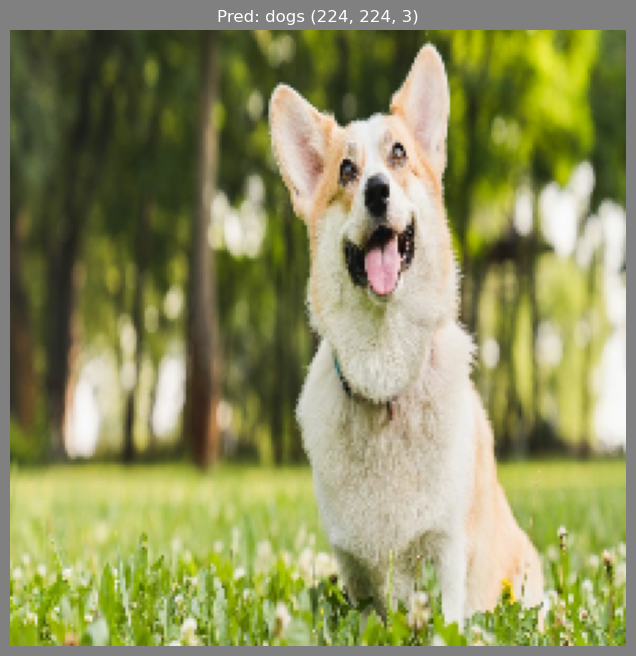

In [80]:
img = soml.data.image.load_image_as_tensor(filename=os.path.join(SAMPLES_DIR, "dog_1.jpg"), img_shape=IMG_SHAPE, scale=True)
y_pred = soml.util.label.probability_to_class(model.predict(x=soml.tf.tensor.add_batch_to_tensor(img)))
soml.data.image.show_single_image_from_nparray_or_tensor(image=img, title=f"Pred: {class_names[y_pred[0]]}")

1/1 [==============================] - 0s 9ms/step


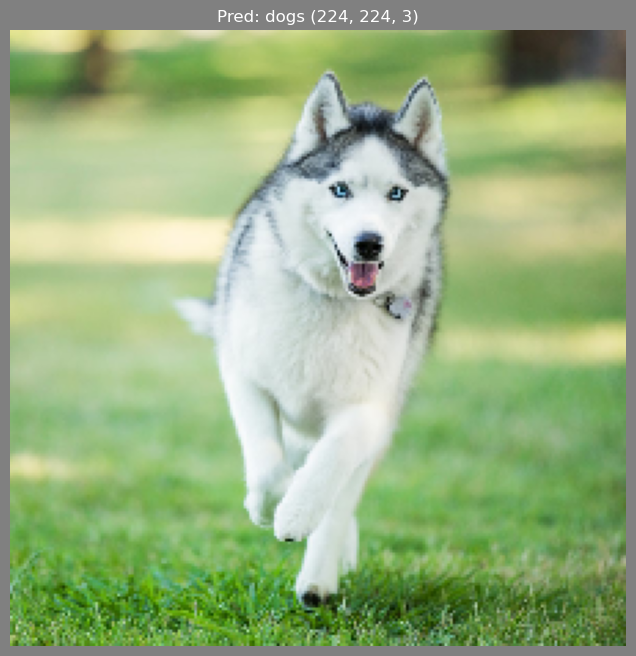

In [81]:
img = soml.data.image.load_image_as_tensor(filename=os.path.join(SAMPLES_DIR, "dog_2.jpg"), img_shape=IMG_SHAPE, scale=True)
y_pred = soml.util.label.probability_to_class(model.predict(x=soml.tf.tensor.add_batch_to_tensor(img)))
soml.data.image.show_single_image_from_nparray_or_tensor(image=img, title=f"Pred: {class_names[y_pred[0]]}")

1/1 [==============================] - 0s 9ms/step


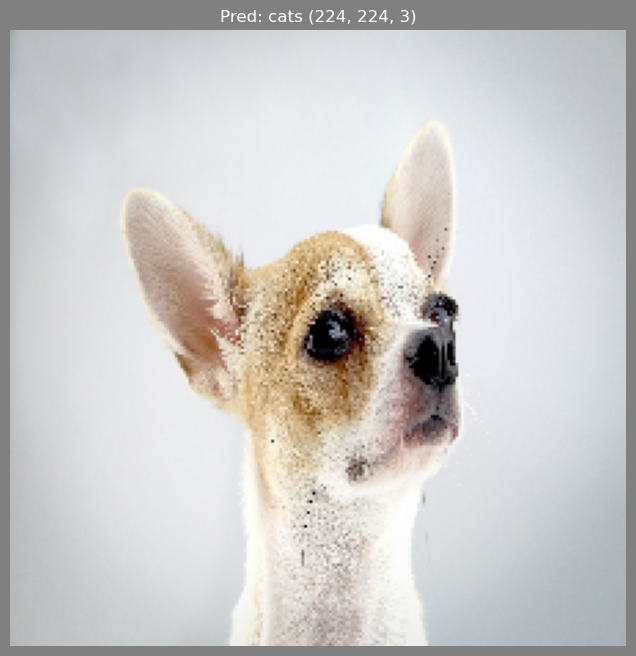

In [82]:
img = soml.data.image.load_image_as_tensor(filename=os.path.join(SAMPLES_DIR, "dog_3.jpg"), img_shape=IMG_SHAPE, scale=True)
y_pred = soml.util.label.probability_to_class(model.predict(x=soml.tf.tensor.add_batch_to_tensor(img)))
soml.data.image.show_single_image_from_nparray_or_tensor(image=img, title=f"Pred: {class_names[y_pred[0]]}")